In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math 

In [3]:
train = pd.read_csv('C:/Users/Amir Hassan/Desktop/Python/train.csv', skipinitialspace=True) 

In [4]:
train.head()

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,...,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing,genre
0,Long Road,241760,False,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,...,0.281,0.6350,142.221,241760,4.0,567.0,141.0,NaN,1.279305,j-dance
1,"Daniâl My Son, Where Did You Vanish?",444000,False,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,...,0.360,0.0336,75.596,444000,4.0,617.0,155.0,NaN,2.367412,iranian
2,Ondskapens Galakse,333506,False,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,...,0.262,0.4890,116.628,333507,4.0,652.0,162.0,NaN,3.700483,black-metal
3,Can't Look Away,269800,False,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,...,0.117,0.3850,140.880,269800,4.0,619.0,155.0,0.469,1.279305,bluegrass
4,Thunderground,307651,False,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,...,0.299,0.6370,143.956,307652,4.0,733.0,183.0,NaN,4.067086,happy


In [5]:
train.shape

(15000, 24)

In [6]:
train.dtypes

name                      object
duration_ms                int64
explicit                    bool
popularity                 int64
artists                   object
album_name                object
danceability             float64
energy                   float64
key                        int64
loudness                 float64
mode                     float64
speechiness              float64
acousticness             float64
instrumentalness         float64
liveness                 float64
valence                  float64
tempo                    float64
features_duration_ms       int64
time_signature           float64
n_beats                  float64
n_bars                   float64
popularity_confidence    float64
processing               float64
genre                     object
dtype: object

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   name                   15000 non-null  object 
 1   duration_ms            15000 non-null  int64  
 2   explicit               15000 non-null  bool   
 3   popularity             15000 non-null  int64  
 4   artists                15000 non-null  object 
 5   album_name             15000 non-null  object 
 6   danceability           15000 non-null  float64
 7   energy                 15000 non-null  float64
 8   key                    15000 non-null  int64  
 9   loudness               15000 non-null  float64
 10  mode                   10550 non-null  float64
 11  speechiness            15000 non-null  float64
 12  acousticness           15000 non-null  float64
 13  instrumentalness       15000 non-null  float64
 14  liveness               15000 non-null  float64
 15  va

In [8]:
train.describe()

,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing
count,1.500000e+04,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,10550.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,1.500000e+04,12938.000000,15000.000000,15000.00000,2217.000000,15000.000000
mean,2.468075e+05,27.423667,0.551063,0.656231,5.287867,-8.894999,0.631374,0.083779,0.303896,0.286734,0.216790,0.436853,123.116544,2.467947e+05,3.876179,501.862333,128.39340,0.490479,2.199647
std,1.279941e+05,18.587534,0.194239,0.264371,3.585023,6.005799,0.482455,0.086709,0.329536,0.382930,0.195295,0.277220,31.930958,1.279850e+05,0.566491,280.689804,75.11391,0.291330,1.212616
min,8.586000e+03,0.000000,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.587000e+03,0.000000,0.000000,0.00000,0.000000,0.748116
25%,1.800000e+05,14.000000,0.441000,0.480000,2.000000,-10.636250,0.000000,0.037300,0.009745,0.000000,0.097900,0.196000,99.939000,1.800000e+05,4.000000,327.000000,83.00000,0.230000,1.170953
50%,2.278260e+05,24.000000,0.580000,0.709000,5.000000,-7.303000,1.000000,0.051000,0.155000,0.003130,0.131000,0.416000,124.188000,2.278185e+05,4.000000,461.000000,117.00000,0.480000,1.738916
75%,2.889030e+05,42.000000,0.695000,0.884000,8.000000,-5.101000,1.000000,0.088600,0.573000,0.744000,0.280000,0.664000,141.986500,2.889030e+05,4.000000,625.000000,159.00000,0.739000,3.349057
max,4.120258e+06,94.000000,0.980000,1.000000,11.000000,3.156000,1.000000,0.939000,0.996000,1.000000,0.994000,0.995000,220.525000,4.120258e+06,5.000000,7348.000000,2170.00000,1.000000,4.067086


In [9]:
list(train.columns)

['name',
 'duration_ms',
 'explicit',
 'popularity',
 'artists',
 'album_name',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'features_duration_ms',
 'time_signature',
 'n_beats',
 'n_bars',
 'popularity_confidence',
 'processing',
 'genre']

In [10]:
train.index

RangeIndex(start=0, stop=15000, step=1)

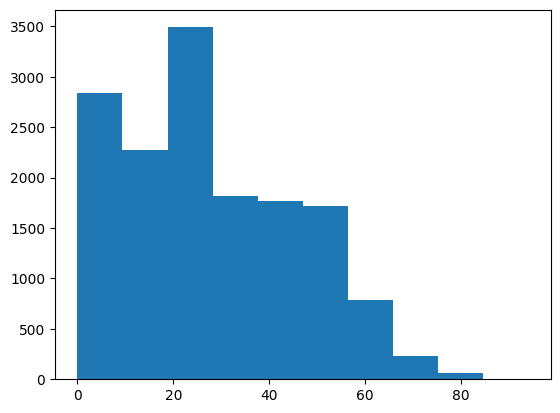

In [11]:
plt.hist( train['popularity'], bins=10)
plt.show()


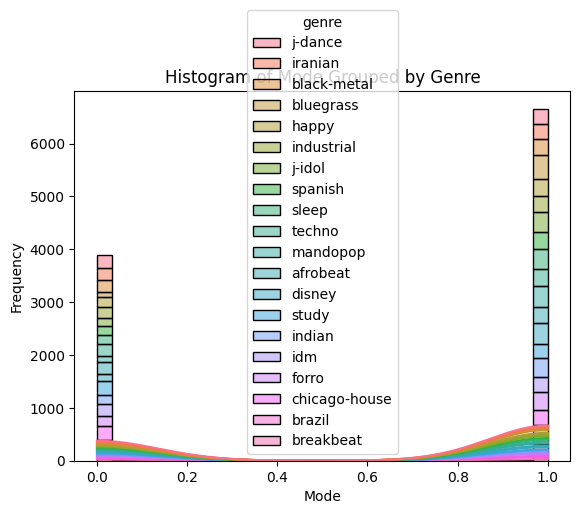

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt


# Assuming 'df' is your DataFrame
sns.histplot(data=train, x='mode', hue='genre', multiple='stack', bins=30, kde=True)
plt.title('Histogram of Mode Grouped by Genre')
plt.xlabel('Mode')
plt.ylabel('Frequency')
plt.show()

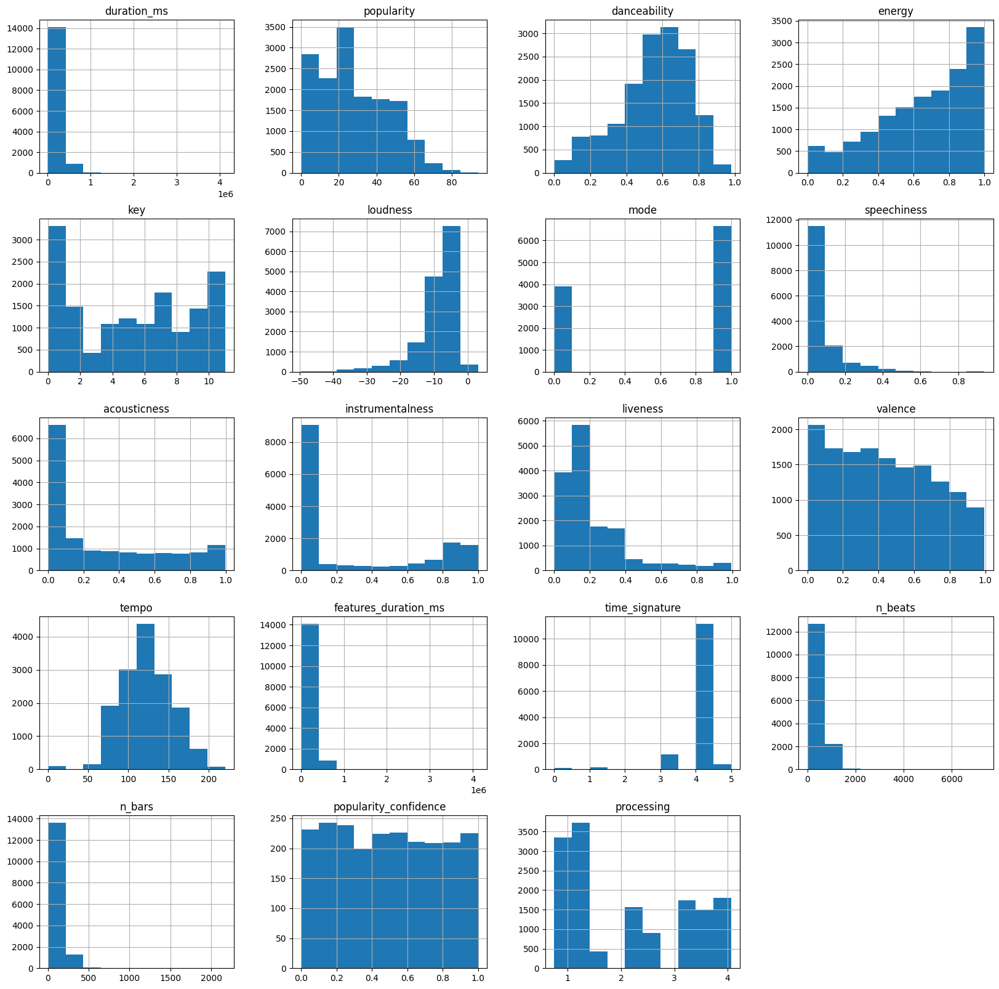

In [13]:
train.hist(figsize=(20,20))
plt.show()

In [14]:
for column in train.columns:
    if train[column].dtype == bool:
        print(f"Column '{column}' contains boolean values: {train[column].unique()}")


Column 'explicit' contains boolean values: [False  True]


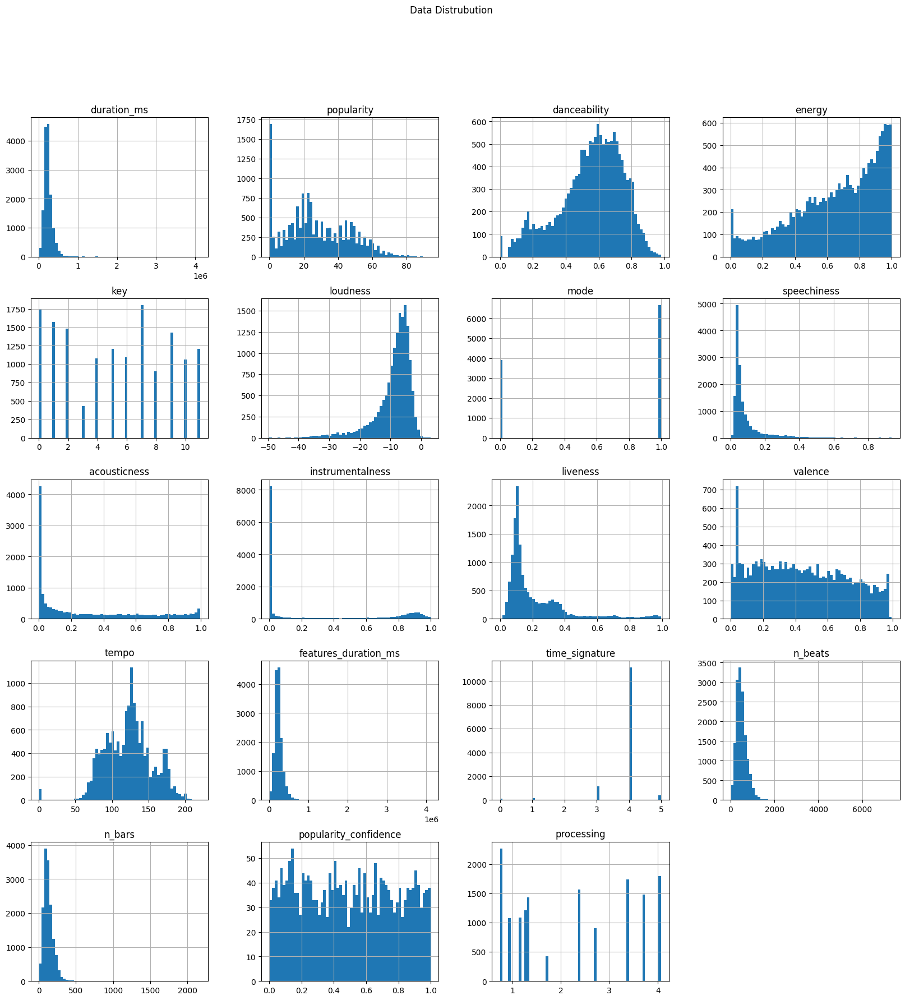

In [15]:
continous_cols = train.select_dtypes(include=[float, int])
continous_cols.hist(figsize=(20,20), bins=60)
plt.suptitle("Data Distrubution")

plt.show()

In [16]:

columns_of_interest = ['duration_ms', 'popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
                       'instrumentalness', 'liveness', 'valence']  # my column names

continuous_cols = train[columns_of_interest]  # Select the continuous columns

statistics = continuous_cols.describe()

# Additional statistics
statistics.loc['variance'] = continuous_cols.var()  # Variance
statistics.loc['skewness'] = continuous_cols.skew()  # Skewness
statistics.loc['kurtosis'] = continuous_cols.kurtosis()  # Kurtosis

print(statistics)


           duration_ms    popularity  danceability        energy  \
count     1.500000e+04  15000.000000  15000.000000  15000.000000   
mean      2.468075e+05     27.423667      0.551063      0.656231   
std       1.279941e+05     18.587534      0.194239      0.264371   
min       8.586000e+03      0.000000      0.000000      0.000000   
25%       1.800000e+05     14.000000      0.441000      0.480000   
50%       2.278260e+05     24.000000      0.580000      0.709000   
75%       2.889030e+05     42.000000      0.695000      0.884000   
max       4.120258e+06     94.000000      0.980000      1.000000   
variance  1.638248e+10    345.496406      0.037729      0.069892   
skewness  7.740694e+00      0.347758     -0.622243     -0.680355   
kurtosis  1.615576e+02     -0.657472     -0.135270     -0.467730   

                   key      loudness          mode   speechiness  \
count     15000.000000  15000.000000  10550.000000  15000.000000   
mean          5.287867     -8.894999      0.631

In [17]:
# Check for missing values
missing_values = train.isnull().sum()

# Summary statistics to identify outliers
summary_stats = train.describe()

# Data types and basic info
data_info = train.info()

# Checking unique values or value counts for categorical columns
unique_values = {col: train[col].unique() for col in train.select_dtypes(include='object').columns}
value_counts = {col: train[col].value_counts() for col in train.select_dtypes(include='object').columns}


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   name                   15000 non-null  object 
 1   duration_ms            15000 non-null  int64  
 2   explicit               15000 non-null  bool   
 3   popularity             15000 non-null  int64  
 4   artists                15000 non-null  object 
 5   album_name             15000 non-null  object 
 6   danceability           15000 non-null  float64
 7   energy                 15000 non-null  float64
 8   key                    15000 non-null  int64  
 9   loudness               15000 non-null  float64
 10  mode                   10550 non-null  float64
 11  speechiness            15000 non-null  float64
 12  acousticness           15000 non-null  float64
 13  instrumentalness       15000 non-null  float64
 14  liveness               15000 non-null  float64
 15  va

In [18]:
# Check for missing values in each column
missing_values = train.isnull().sum()
print(missing_values)


name                         0
duration_ms                  0
explicit                     0
popularity                   0
artists                      0
album_name                   0
danceability                 0
energy                       0
key                          0
loudness                     0
mode                      4450
speechiness                  0
acousticness                 0
instrumentalness             0
liveness                     0
valence                      0
tempo                        0
features_duration_ms         0
time_signature            2062
n_beats                      0
n_bars                       0
popularity_confidence    12783
processing                   0
genre                        0
dtype: int64


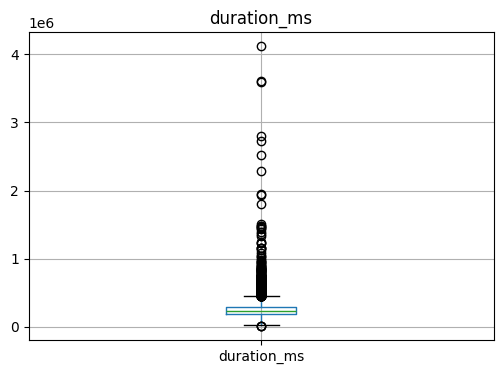

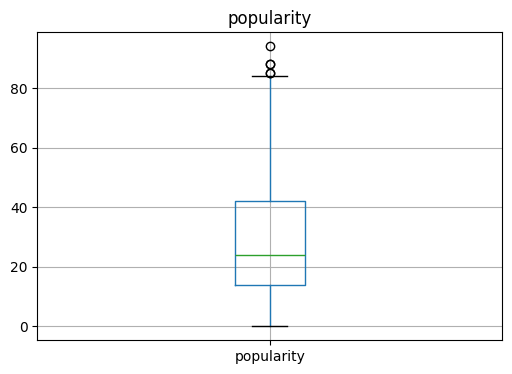

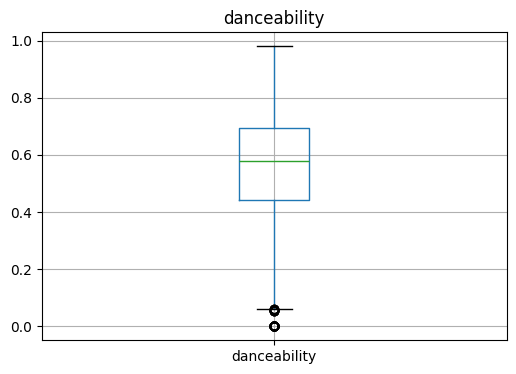

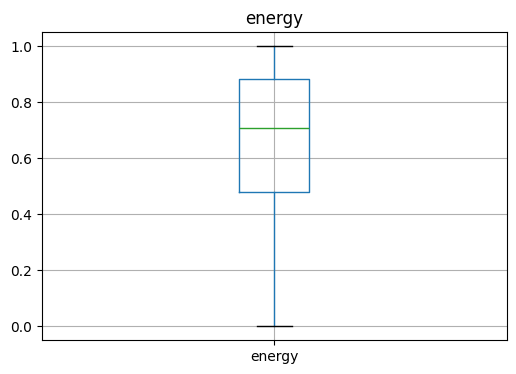

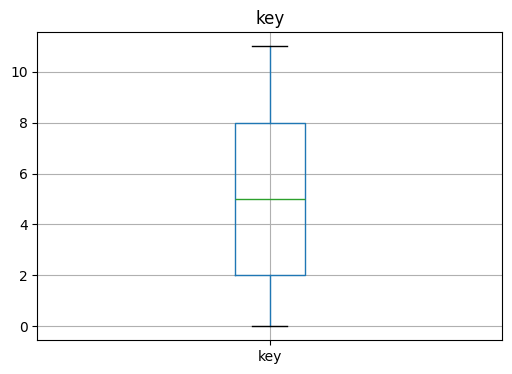

...

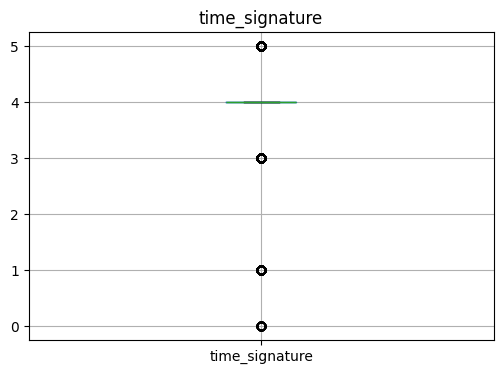

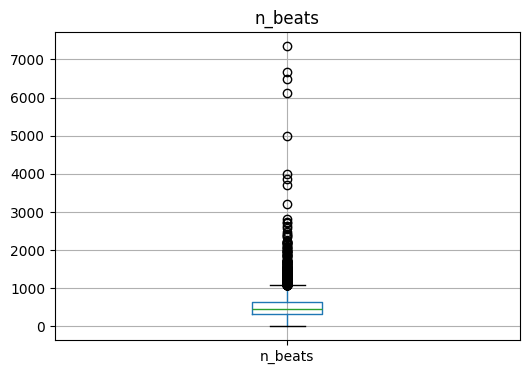

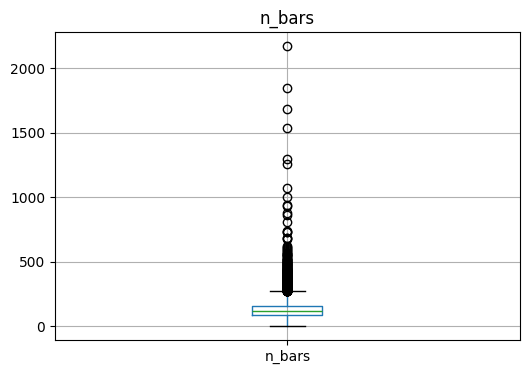

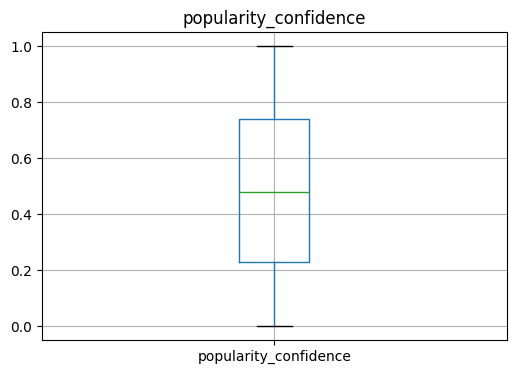

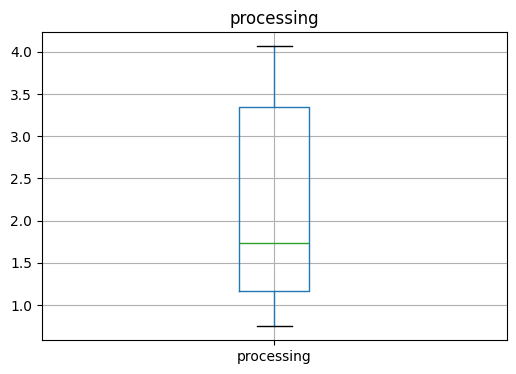

In [19]:
# Boxplots for numerical columns to identify outliers
numerical_columns = train.select_dtypes(include=['int64', 'float64']).columns
for col in numerical_columns:
    plt.figure(figsize=(6, 4))
    train.boxplot(column=col)
    plt.title(col)
    plt.show()


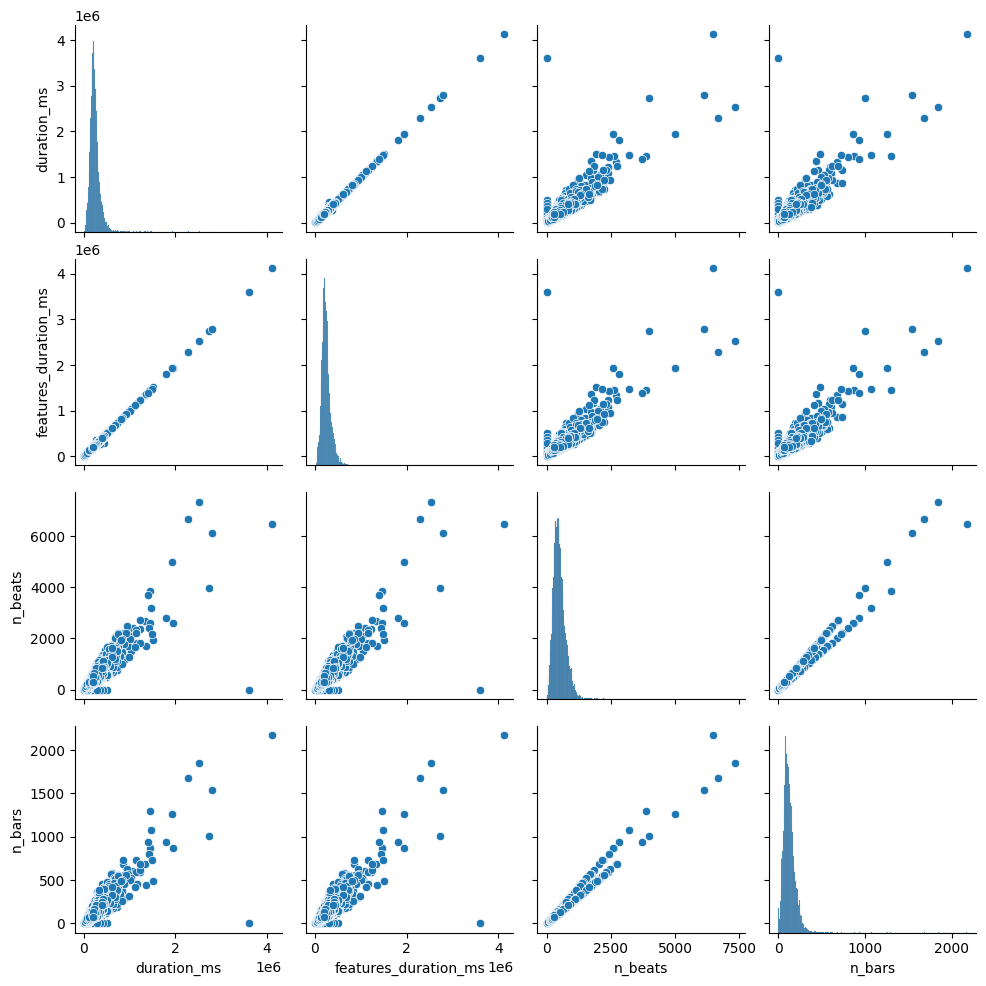

In [20]:
import warnings
import seaborn as sns

# Suppress warnings
warnings.filterwarnings("ignore")
# Select specific numerical columns for the pair plot
numerical_columns = ['duration_ms', 'features_duration_ms', 'n_beats', 'n_bars']  # Replace with your desired numerical columns
# Create pair plot
sns.pairplot(train[numerical_columns])
plt.show()

name                      object
duration_ms                int64
explicit                    bool
popularity                 int64
artists                   object
album_name                object
danceability             float64
energy                   float64
key                        int64
loudness                 float64
mode                     float64
speechiness              float64
acousticness             float64
instrumentalness         float64
liveness                 float64
valence                  float64
tempo                    float64
features_duration_ms       int64
time_signature           float64
n_beats                  float64
n_bars                   float64
popularity_confidence    float64
processing               float64
genre                     object
dtype: object
duration_ms                  0
popularity                   0
danceability                 0
energy                       0
key                          0
loudness                     0
mode    

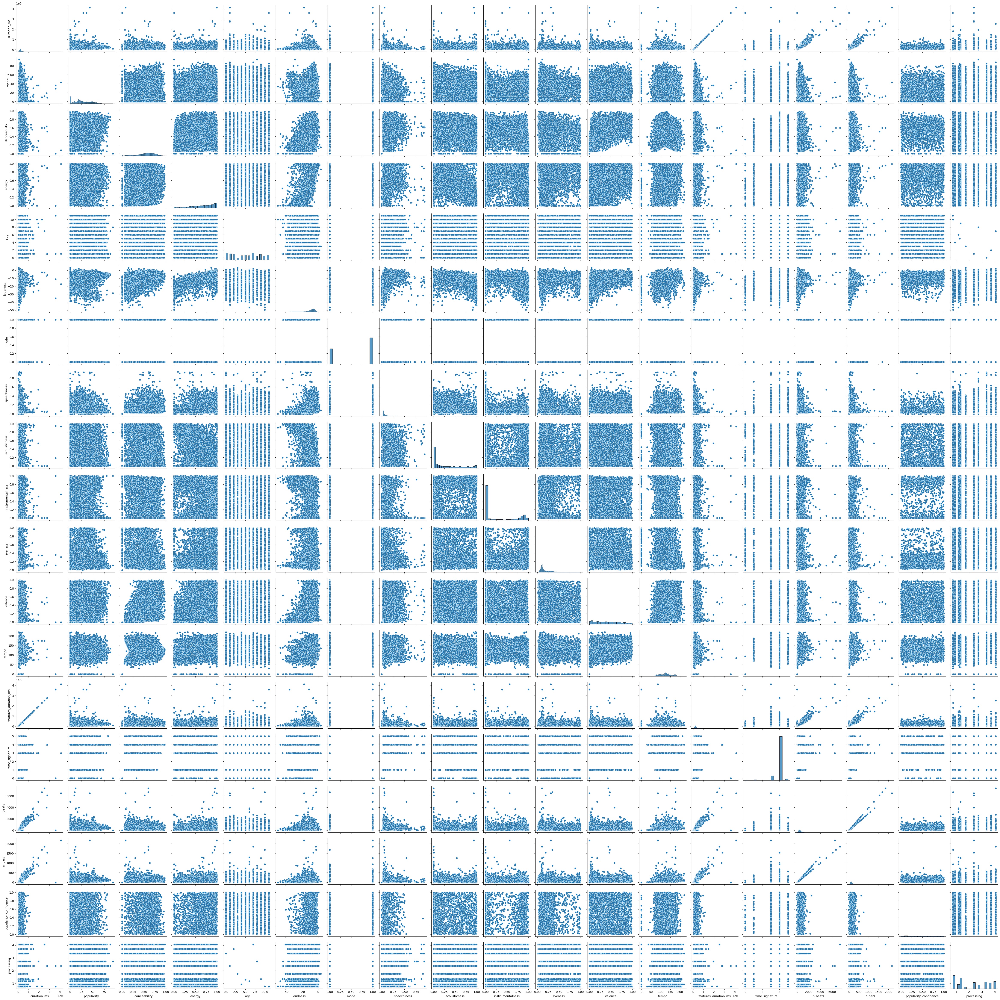

In [21]:
# Check the types of columns in the dataset
print(train.dtypes)

# Select numerical columns for scatterplot
numerical_columns = train.select_dtypes(include=['float64', 'int64'])

# Check if there are any missing values
print(numerical_columns.isnull().sum())

# Create pairplot
sns.pairplot(numerical_columns)
plt.show()

Missing Values in Each Column:
name                         0
duration_ms                  0
explicit                     0
popularity                   0
artists                      0
album_name                   0
danceability                 0
energy                       0
key                          0
loudness                     0
mode                      4450
speechiness                  0
acousticness                 0
instrumentalness             0
liveness                     0
valence                      0
tempo                        0
features_duration_ms         0
time_signature            2062
n_beats                      0
n_bars                       0
popularity_confidence    12783
processing                   0
genre                        0
dtype: int64

Missing Values After Filling:
name                     0
duration_ms              0
explicit                 0
popularity               0
artists                  0
album_name               0
danceability       

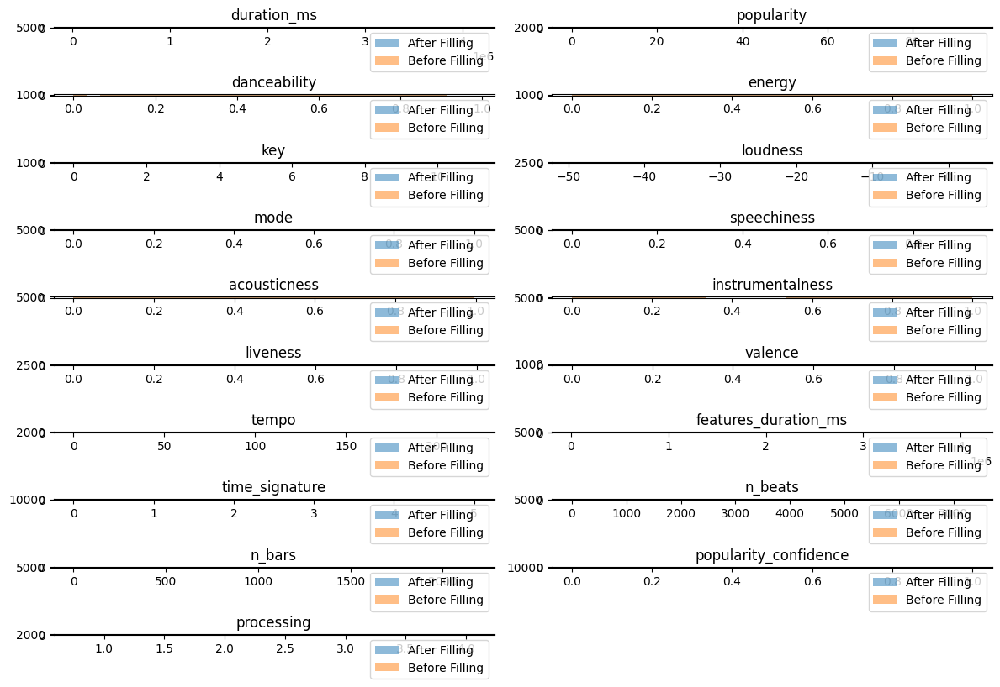

In [22]:
# Check for missing values in each column
missing_values = train.isnull().sum()
print("Missing Values in Each Column:")
print(missing_values)

# Handling missing values:
# Let's say we want to fill missing values in numerical columns with the mean and in categorical columns with mode.

# Numerical columns: Fill missing values with mean
numerical_columns = train.select_dtypes(include=['int64', 'float64']).columns
for col in numerical_columns:
    train[col].fillna(train[col].mean(), inplace=True)

# Categorical columns: Fill missing values with mode
categorical_columns = train.select_dtypes(include=['object']).columns
for col in categorical_columns:
    train[col].fillna(train[col].mode()[0], inplace=True)

# Verify if missing values are filled
missing_values_after_filling = train.isnull().sum()
print("\nMissing Values After Filling:")
print(missing_values_after_filling)


# Plot histograms for numerical columns before and after filling missing values
num_cols = len(numerical_columns)
num_rows = math.ceil(num_cols / 2)  # Calculate the number of rows needed for the subplots

plt.figure(figsize=(12, 8))

for i, col in enumerate(numerical_columns):
    plt.subplot(num_rows, 2, i+1)  # Adjust subplot layout
    plt.hist(train[col].dropna(), bins=30, alpha=0.5, label='After Filling')  # Plot after filling
    plt.hist(train[col].dropna(), bins=30, alpha=0.5, label='Before Filling')  # Plot before filling
    plt.title(col)
    plt.legend()

plt.tight_layout()
plt.show()


In [31]:
train.isnull().sum()

name                         0
duration_ms                  0
explicit                     0
popularity                   0
artists                      0
album_name                   0
danceability                 0
energy                       0
key                          0
loudness                     0
mode                         0
speechiness                  0
acousticness                 0
instrumentalness             0
liveness                     0
valence                      0
tempo                        0
features_duration_ms         0
time_signature               0
n_beats                      0
n_bars                       0
popularity_confidence        0
processing                   0
genre                        0
log_transformed_column       0
sqrt_transformed_column      0
exp_transformed_column       0
boxcox_transformed_column    0
log_duration_ms              0
log_features_duration_ms     0
log_n_bars                   0
log_n_beats                  0
log_spee

In [23]:
missing_values_after_filling

name                     0
duration_ms              0
explicit                 0
popularity               0
artists                  0
album_name               0
danceability             0
energy                   0
key                      0
loudness                 0
mode                     0
speechiness              0
acousticness             0
instrumentalness         0
liveness                 0
valence                  0
tempo                    0
features_duration_ms     0
time_signature           0
n_beats                  0
n_bars                   0
popularity_confidence    0
processing               0
genre                    0
dtype: int64

In [24]:
from scipy import stats  # Importing stats module from scipy

# Perform log transformation on the 'duration_ms' column
train['log_transformed_column'] = np.log(train['duration_ms' ])



# Perform square root transformation on a numerical column
train['sqrt_transformed_column'] = np.sqrt(train['duration_ms'])

# Perform exponential transformation on a numerical column
train['exp_transformed_column'] = np.exp(train['duration_ms'])

# Perform Box-Cox transformation on a numerical column
train['boxcox_transformed_column'], _ = stats.boxcox(train['duration_ms'])

# Display the results
print("Log Transformation Result for 'duration_ms' column:")
print(train['log_transformed_column'])
print("Log Square Result for 'duration_ms' column:")
print(train['sqrt_transformed_column'])
print("Log Exponential Result for 'duration_ms' column:")
print(train['exp_transformed_column'])
print("Log Boxcox Result for 'duration_ms' column:")
print(train['boxcox_transformed_column'])


Log Transformation Result for 'duration_ms' column:
0        12.395701
1        13.003580
2        12.717416
3        12.505436
4        12.636721
           ...    
14995    12.976241
14996    12.115852
14997    12.899447
14998    12.192227
14999    12.198086
Name: log_transformed_column, Length: 15000, dtype: float64
Log Square Result for 'duration_ms' column:
0        491.690960
1        666.333250
2        577.499784
3        519.422757
4        554.662961
            ...    
14995    657.286848
14996    427.488012
14997    632.527470
14998    444.128360
14999    445.431252
Name: sqrt_transformed_column, Length: 15000, dtype: float64
Log Exponential Result for 'duration_ms' column:
0        inf
1        inf
2        inf
3        inf
4        inf
        ... 
14995    inf
14996    inf
14997    inf
14998    inf
14999    inf
Name: exp_transformed_column, Length: 15000, dtype: float64
Log Boxcox Result for 'duration_ms' column:
0        34.314235
1        38.077949
2        36.265214
3

In [25]:
columns_to_transform = ['duration_ms', 'features_duration_ms', 'n_bars', 'n_beats', 'speechiness', 'instrumentalness', 'acousticness']

for col in columns_to_transform:
    train[f'log_{col}'] = np.log(train[col])

# Display the results for a specific column, for instance, 'duration_ms'
# specific_column = 'duration_ms'
# print(f"Log Transformation Result for '{specific_column}' column:")
# print(train[f'log_{specific_column}'])

for col in columns_to_transform:
    log_col = f'log_{col}'
    print(f"Log Transformation Result for '{col}' column:")
    print(train[log_col])
    print("\n")

Log Transformation Result for 'duration_ms' column:
0        12.395701
1        13.003580
2        12.717416
3        12.505436
4        12.636721
           ...    
14995    12.976241
14996    12.115852
14997    12.899447
14998    12.192227
14999    12.198086
Name: log_duration_ms, Length: 15000, dtype: float64


Log Transformation Result for 'features_duration_ms' column:
0        12.395701
1        13.003580
2        12.717419
3        12.505436
4        12.636725
           ...    
14995    12.976243
14996    12.115858
14997    12.899447
14998    12.192227
14999    12.198086
Name: log_features_duration_ms, Length: 15000, dtype: float64


Log Transformation Result for 'n_bars' column:
0        4.948760
1        5.043425
2        5.087596
3        5.043425
4        5.209486
           ...   
14995    5.356586
14996    4.521789
14997    5.342334
14998    4.867534
14999    4.276666
Name: log_n_bars, Length: 15000, dtype: float64


Log Transformation Result for 'n_beats' column:
0      

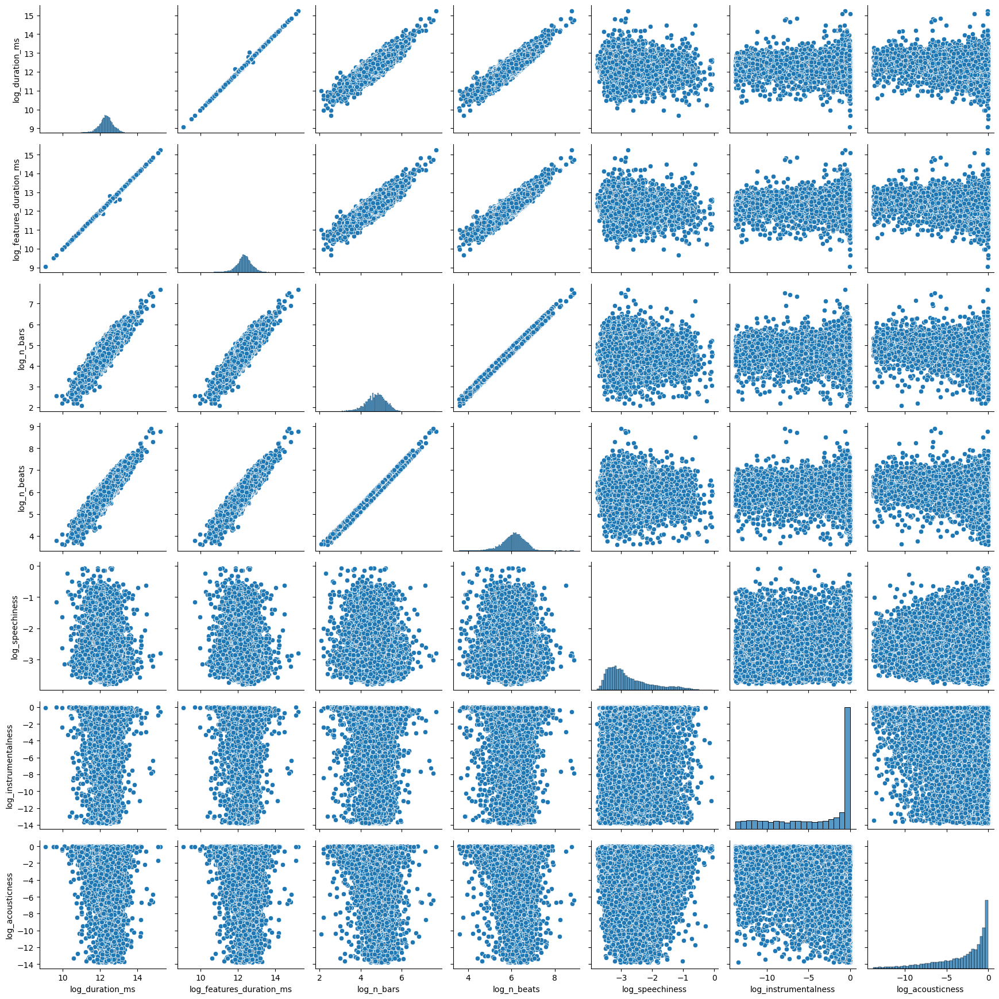

In [26]:
log_transformed_columns = [f'log_{col}' for col in columns_to_transform]

# Create pair plot for log-transformed columns
sns.pairplot(train[log_transformed_columns])
plt.tight_layout()
plt.show()

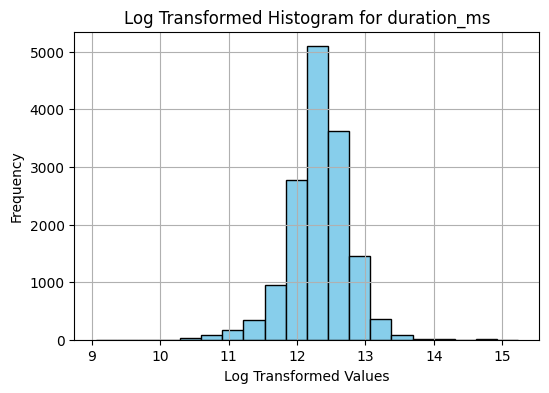

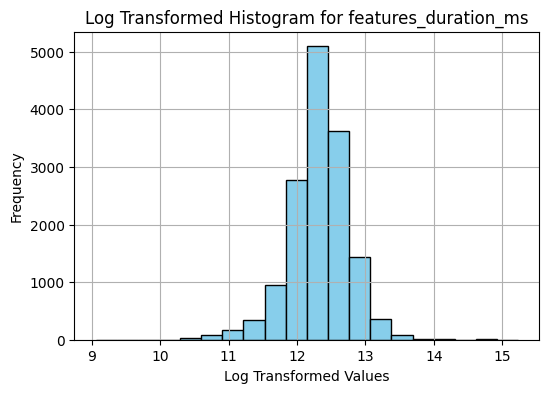

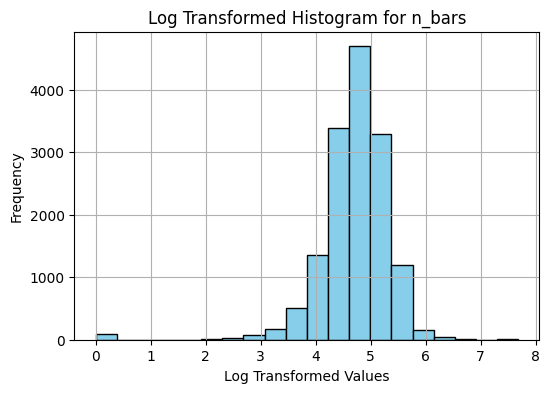

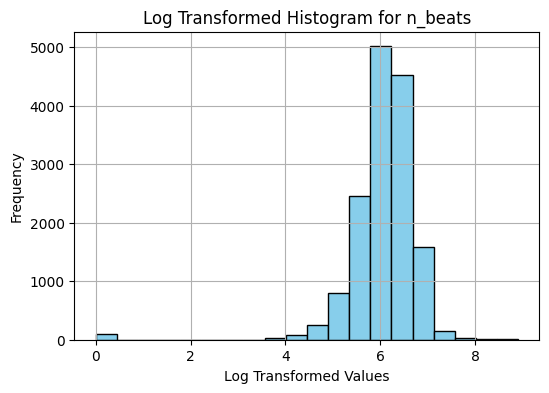

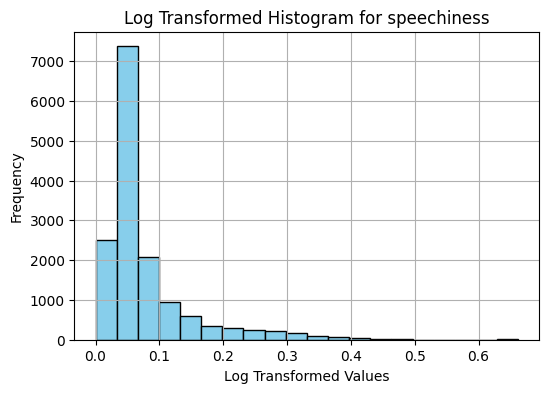

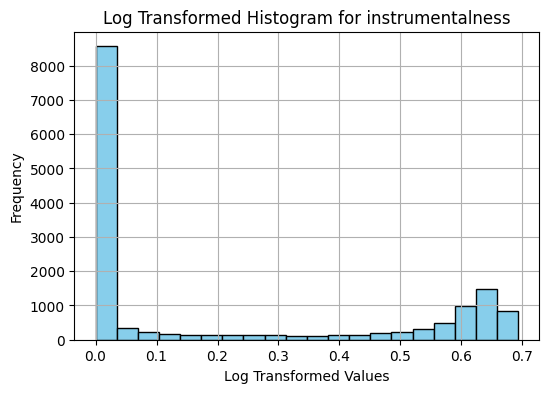

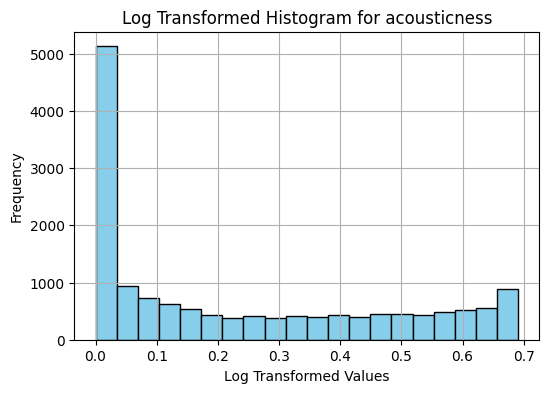

In [27]:
for col in columns_to_transform:
    train[f'log_{col}'] = np.log1p(train[col])  # Using np.log1p to handle zero and negative values

# Plot histograms for log-transformed columns
for col in columns_to_transform:
    log_col = f'log_{col}'
    plt.figure(figsize=(6, 4))
    plt.hist(train[log_col].dropna(), bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Log Transformed Histogram for {col}')
    plt.xlabel('Log Transformed Values')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

In [28]:
columns_to_exponentiate = ['loudness', 'speechiness']

for col in columns_to_exponentiate:
    train[f'exp_{col}'] = np.exp(train[col])

# Display the results for the specified columns after the exponential transformation
for col in columns_to_exponentiate:
    exp_col = f'exp_{col}'
    print(f"Exponential Transformation Result for '{col}' column:")
    print(train[exp_col])
    print("\n")


Exponential Transformation Result for 'loudness' column:
0        3.620132e-06
1        1.694582e-11
2        5.843561e-04
3        3.672069e-03
4        1.188777e-05
             ...     
14995    6.593575e-07
14996    2.992969e-09
14997    1.113313e-04
14998    1.003592e-01
14999    4.138529e-04
Name: exp_loudness, Length: 15000, dtype: float64


Exponential Transformation Result for 'speechiness' column:
0        1.102411
1        1.083829
2        1.040499
3        1.079502
4        1.055379
           ...   
14995    1.057386
14996    1.061306
14997    1.061200
14998    1.054535
14999    1.035827
Name: exp_speechiness, Length: 15000, dtype: float64




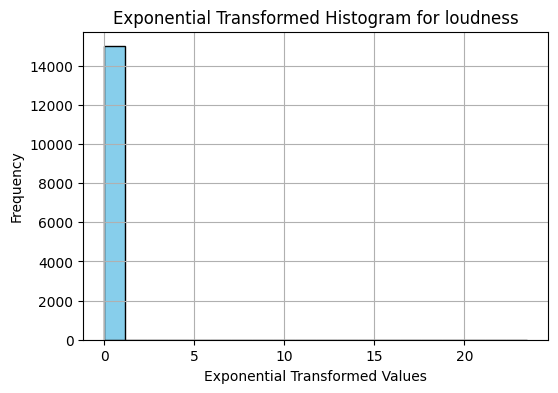

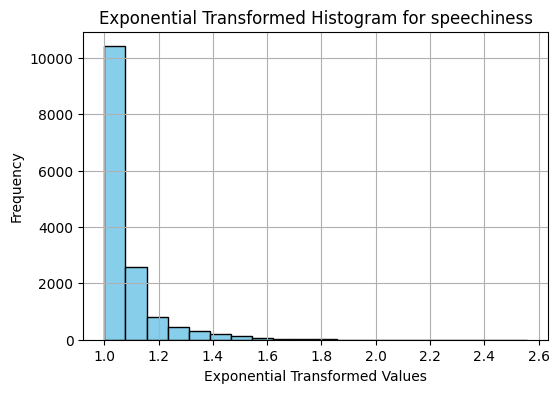

In [29]:
# Plot graphs for the exponential transformed columns
for col in columns_to_exponentiate:
    exp_col = f'exp_{col}'
    plt.figure(figsize=(6, 4))
    plt.hist(train[exp_col].dropna(), bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Exponential Transformed Histogram for {col}')
    plt.xlabel('Exponential Transformed Values')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

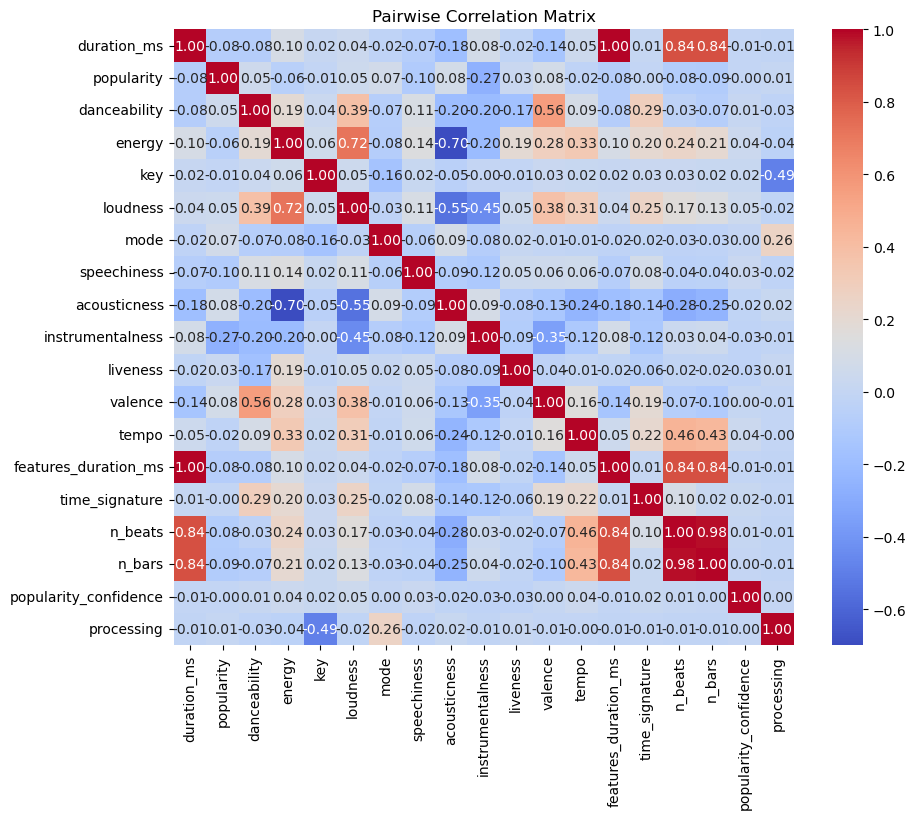

In [3]:
import seaborn as sns  # Import Seaborn

# Select only numerical columns for correlation
numerical_columns = train.select_dtypes(include=['float64', 'int64'])

# Compute pairwise correlation matrix for numerical columns
correlation_matrix = numerical_columns.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Pairwise Correlation Matrix')
plt.show()

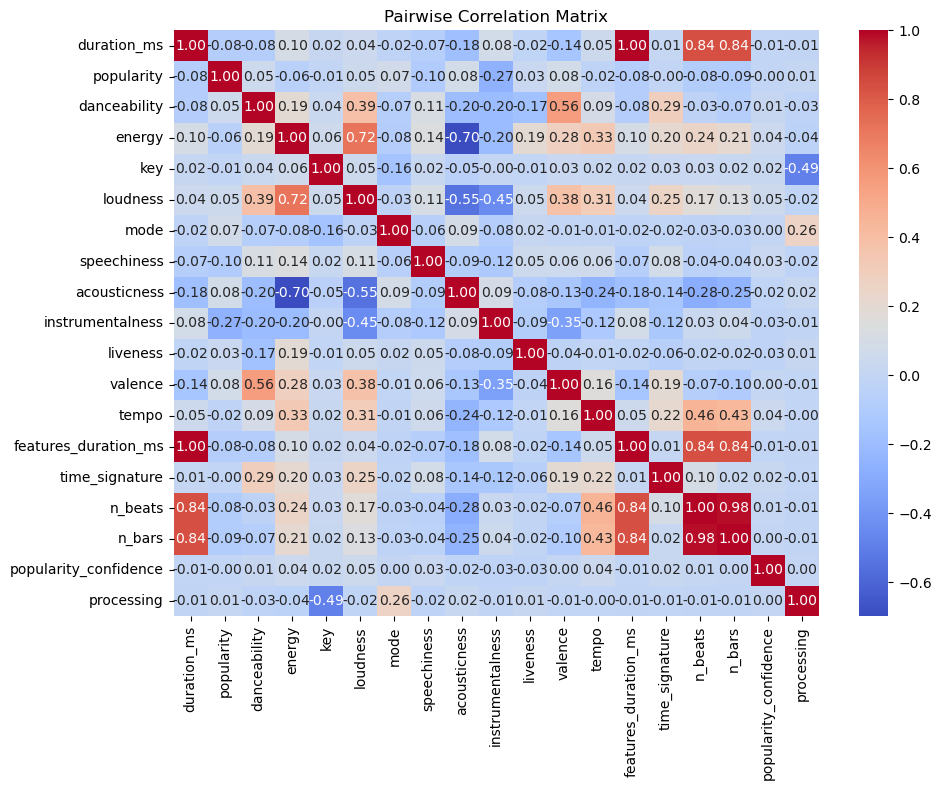

In [4]:
import seaborn as sns

# Select only numerical columns for correlation
numerical_columns = train.select_dtypes(include=['float64', 'int64'])

# Compute pairwise correlation matrix for numerical columns
correlation_matrix = numerical_columns.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Pairwise Correlation Matrix')
plt.tight_layout()
plt.show()
